In [1]:
import os
import tensorflow as tf
from tensorflow import keras
import matplotlib.pyplot as plt
import matplotlib as mpl
import numpy as np
import PIL.Image
import time
import functools
from PIL import Image
import random

In [2]:
#use GPU
device_name = tf.test.gpu_device_name()
if device_name != '/device:GPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

Found GPU at: /device:GPU:0


In [3]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [4]:
!unzip "/content/drive/MyDrive/DeepLearn/datasets/NST_data.zip" >/dev/null

In [5]:
content_images = '/content/NST_data/content_images'
style_images = '/content/NST_data/style_images'

In [7]:
def load_img(folder, img_names):
  list_images = []
  for img_nm in img_names:
    if img_nm=='.DS_Store': continue
    path_to_img = folder+'/'+img_nm
    max_dim = 512
    img = tf.io.read_file(path_to_img)
    img = tf.image.decode_image(img, channels=3)
    img = tf.image.convert_image_dtype(img, tf.float32)
    img = tf.image.resize(img, size= (max_dim,max_dim))
    img = img[tf.newaxis, :]
    list_images.append(img)
  return list_images

content_names = os.listdir(content_images)
style_names = os.listdir(style_images)

cont_imgs = load_img(content_images, content_names)
style_imgs = load_img(style_images, style_names)

*Neural Style Transfer (NTS) is performed by merging two images together in such a way to have the same content of an image (content image) but with the style of another (style image).*

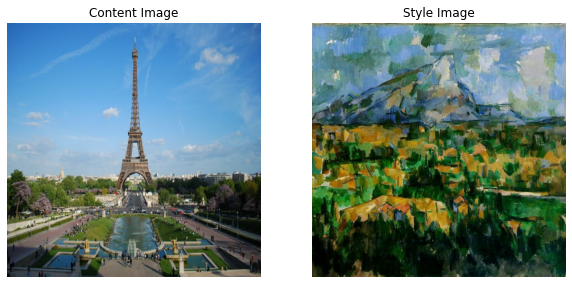

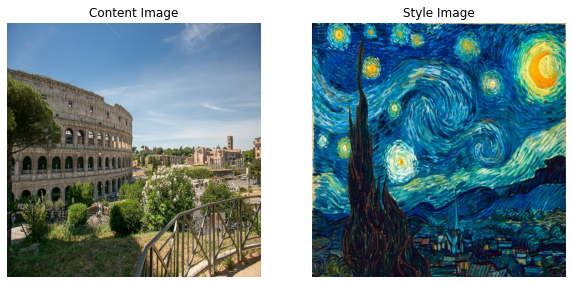

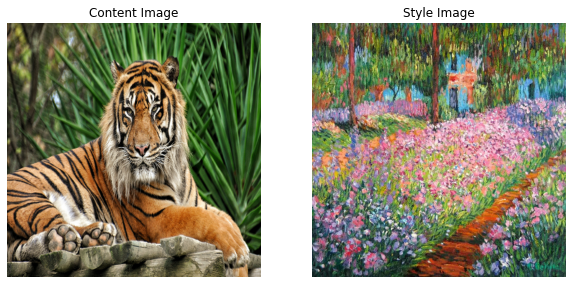

In [8]:
def imshow(image, title=None):
  if len(image.shape) > 3:
    image = tf.squeeze(image, axis=0)
    plt.imshow(image)
  if title:
    plt.title(title)

for i in range(3):
  plt.figure(figsize=(10, 10))
  content = cont_imgs[i]
  style = style_imgs[i]
  plt.subplot(1, 2, 1)
  imshow(content, 'Content Image')
  plt.axis("off")
  plt.subplot(1, 2, 2)
  imshow(style, 'Style Image')
  plt.axis("off")




* Let's import a pre-trained VGG network already trained to recognize a variety of low-level features, in the shallow layers, and high-level features, in deeper layers.
*  The idea is to match the **content of the generated image G with the content of the content image C**.
*  Since G and C should have similar content, the solution is to chose and **intermediate layer** in order to ensure that the network detect both **lower and higer level features**. This should give the most visually pleasant results.
* Insted, for **Style layer** is good to select many of them due to the fact we could achieve better results if we merge style cost coming from different layers.

In [9]:
vgg_base = tf.keras.applications.VGG19(include_top=False,weights='imagenet')
conv_layers = []
content_layers = []
style_layers = []
for layer in vgg_base.layers:
  name = layer.name.split('_')
  if name[-1].find('conv') == 0:
    conv_layers.append(layer.name)
print('VGG19 conv layers: \n', conv_layers)
#chose intermediate layers from the pre trained VGG to represent content and style of the image
content_layers.append((conv_layers[-1],1))
print(' Content layers: \n', content_layers)
for conv_layer in conv_layers:
  name_c = conv_layer.split('_')
  if name_c[1] == 'conv1': style_layers.append((conv_layer,0.2))
print(' Styile layers: \n', style_layers)


80134624/80134624 [==============================] - 4s 0us/step
VGG19 conv layers: 
 ['block1_conv1', 'block1_conv2', 'block2_conv1', 'block2_conv2', 'block3_conv1', 'block3_conv2', 'block3_conv3', 'block3_conv4', 'block4_conv1', 'block4_conv2', 'block4_conv3', 'block4_conv4', 'block5_conv1', 'block5_conv2', 'block5_conv3', 'block5_conv4']
 Content layers: 
 [('block5_conv4', 1)]
 Styile layers: 
 [('block1_conv1', 0.2), ('block2_conv1', 0.2), ('block3_conv1', 0.2), ('block4_conv1', 0.2), ('block5_conv1', 0.2)]


#Model

In [10]:
def layers_extractor(layers,vgg):
  vgg.trainable = False
  #extract only the layers defined in style and content.
  outputs = [vgg.get_layer(layer[0]).output for layer in layers]
  model = tf.keras.Model([vgg.input], outputs)
  return model

vgg_out = layers_extractor(style_layers + content_layers, vgg_base)

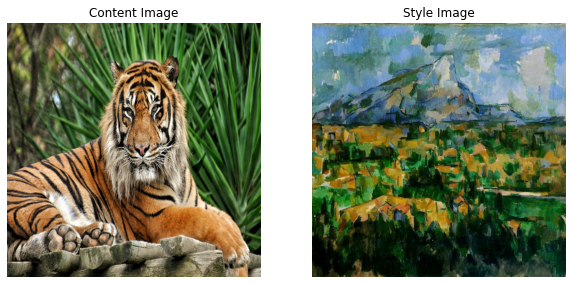

In [12]:
#random select content and style image.
def select_C_S(content_images,style_images):
  content_example_image = random.choice((content_images))
  style_example_image = random.choice((style_images))
  plt.figure(figsize=(10, 10))
  plt.subplot(1, 2, 1)
  imshow(content_example_image, 'Content Image')
  plt.axis("off")
  plt.subplot(1, 2, 2)
  imshow(style_example_image, 'Style Image')
  plt.axis("off")

  return content_example_image, style_example_image

cont_img, style_img = select_C_S(cont_imgs,style_imgs)

#Cost

In [13]:
#Set a_C to be the tensor giving the hidden layer activation for layer "block5_conv4" using the content image
prep_content = tf.Variable(cont_img)
a_C = vgg_out(prep_content)
#a_S is the tensor giving the hidden layer activation for style using our style image.
prep_style =  tf.Variable(style_img)
a_S = vgg_out(prep_style)

**Content Cost**


*   Measure how similar are two activations in a certain hidden layer for both the content image C and the generated image G. 
*   To simplify the computation we unroll the 3D volumnes into a 2D matrix


In [14]:
def content_cost(C_output, G_output):
  #activations of the content
  a_C = C_output[-1]
  #activations of the generated
  a_G = G_output[-1]
  #get shape
  m, n_H, n_W, n_C = a_G.get_shape().as_list()
  #unrolling operation
  a_C_u = tf.reshape(a_C, shape=[m, n_H*n_W, n_C])
  a_G_u = tf.reshape(a_G, shape=[m, n_H*n_W, n_C])
  #content cost computation
  J_content = 1/(4*n_H*n_W*n_C)*tf.reduce_sum(tf.square(tf.subtract(a_C_u,a_G_u)))

  return J_content

**Gram Matrix (Style Matrix S)**


*   Used to compute the **style cost**
*   **$G_{gram}$** it is obtained by computing dot products of a set of vectors `(v_1...v_n). In fact the entries of this matrix are *$G_{gram_{i,j}} = v_i^Tv_j$*
* Basically $G_{gram_{i,j}}$ compares how similar $v_i$ is to $v_j$. If they are highly similar we get a large dot product, otherwise it will be small. In this way it is possibile to compute the correlation between the activations of a filter $i$ and a filter $j$.
* The Gram matrix is computed for both the style image S and the generated image G.


In [15]:
def Style_Matrix(A_mat):
  G_gram = tf.matmul(A_mat,tf.transpose(A_mat))
  return G_gram

**Style cost**


* Style matrix captures the style for both style image S and generated image G. 
*   It turns out the it is possibile to obtain more pleasant results ig we use the style cost function from **multiple different layers**



In [16]:
#compute style cost for a single layer
def layer_style_cost(activation_S, activation_G):
  #get the shape of the two activations
  m,n_H,n_W,n_C = activation_G.get_shape().as_list()
  #unroll the two activations to obtain a 2D matrix for each of them
  a_G_u = tf.transpose(tf.reshape(activation_G, shape=[n_H * n_W, n_C]))
  a_S_u = tf.transpose(tf.reshape(activation_S, shape=[n_H * n_W, n_C]))
  
  #compute gram matrix
  G_G = Style_Matrix(a_G_u)
  G_S = Style_Matrix(a_S_u)
  #compute style cost
  J_style_layer = 1./(4*n_C**2 *(n_H*n_W)**2)*tf.reduce_sum(tf.pow((G_S - G_G), 2))
  return J_style_layer



*   Let's combine costs from different style layers so to obtain the overall style cost function



In [17]:
def style_cost(S_out, G_out, list_style_layers):
  J_style = 0
  #the last element of the array contains the content image so we do not select it
  #a_S is set to be the hidden layer activation from the layer we have selected
  a_S = S_out[:-1]
  #same for a_G, i.e, the output of the choosen hidden layer.
  a_G = G_out[:-1]
  for i, weight in zip(range(len(a_S)), list_style_layers):  
    # Compute style_cost for the current layer
    J_style_layer = layer_style_cost(a_S[i], a_G[i])
    # Add weight * J_style_layer of this layer to overall style cost
    J_style += weight[1] * J_style_layer
  return J_style

**Total Cost**


*   The overall cost is defined in such a way to minimize both the style and the content cost.
* $α$ and $β$ are hyperparameter weighting the importance of  both the content and style cost.

In [18]:
def cost(J_content, J_style, alpha = 10, beta = 40):
  J = alpha*J_content+beta*J_style
  return J 

#Train



* Initialize the generated image G slightly correlated with the content image C.
* This will help the content of the "generated" image more rapidly match the content of the "content" image. 



In [19]:
#utility to display the image
def clip(img):
  return tf.clip_by_value(img, clip_value_min=0.0, clip_value_max=1.0)
  
def tensor_to_image(img):
  img = img * 255
  img = np.array(img, dtype=np.uint8)
  if np.ndim(img) > 3:
    assert img.shape[0] == 1
    img = img[0]
  return Image.fromarray(img)

generated image shape:  (1, 512, 512, 3)


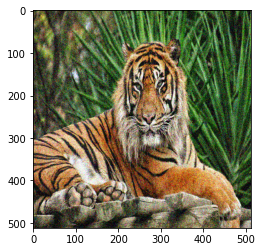

In [20]:
#initialize random noise
#let's frist try for the first image in our dataset
G_image = tf.Variable(cont_img)
noise_image = tf.random.uniform(tf.shape(cont_img), -0.25, 0.25)
G_image = tf.add(G_image, noise_image)
G_image = tf.clip_by_value(G_image, clip_value_min=0.0, clip_value_max=1.0)
print('generated image shape: ', G_image.shape)
plt.imshow(G_image.numpy()[0])
plt.show()

In [21]:
optimizer = tf.keras.optimizers.Adam(learning_rate=0.001, beta_1=0.99)

def train_step(generated_image, style_layers):
  with tf.GradientTape() as tape:
    # Compute a_G as the vgg_model_outputs for the current generated image
    a_G = vgg_out(generated_image)
    # Compute the style cost
    J_style = style_cost(a_S, a_G, style_layers)
    # Compute the content cost
    J_content = content_cost(a_C, a_G)
    # Compute the total cost
    J = cost(J_content, J_style) 
        
  grad = tape.gradient(J, generated_image)
  optimizer.apply_gradients([(grad, generated_image)])
  generated_image.assign(clip(generated_image))
  return J

Epoch 0 


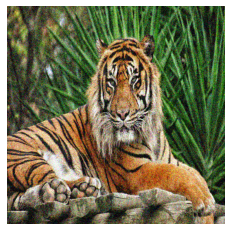

Epoch 250 


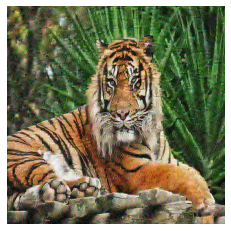

Epoch 500 


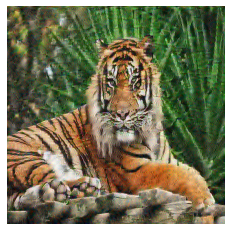

Epoch 750 


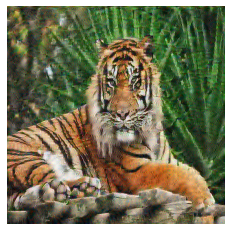

Epoch 1000 


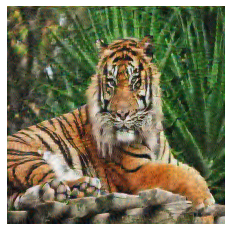

Epoch 1250 


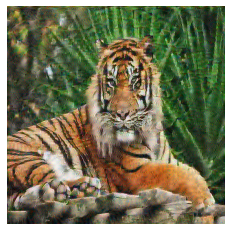

Epoch 1500 


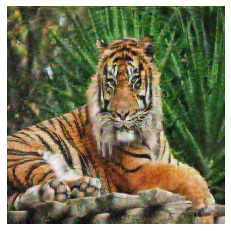

Epoch 1750 


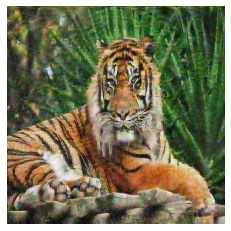

Epoch 2000 


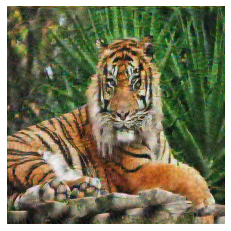

Epoch 2250 


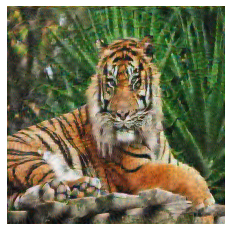

Epoch 2500 


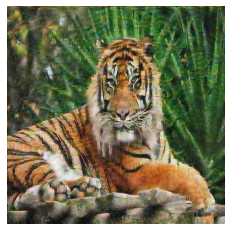

Epoch 2750 


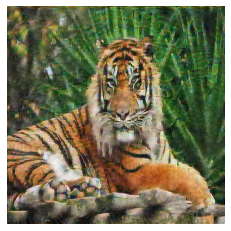

Epoch 3000 


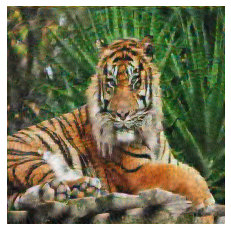

Epoch 3250 


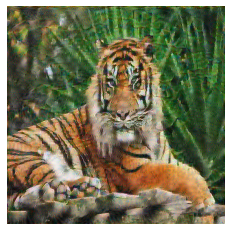

Epoch 3500 


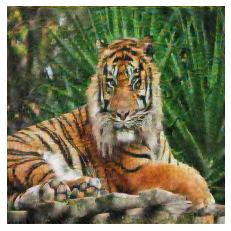

Epoch 3750 


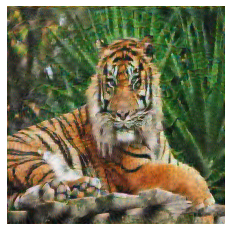

Epoch 4000 


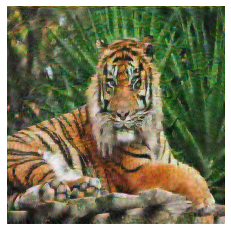

Epoch 4250 


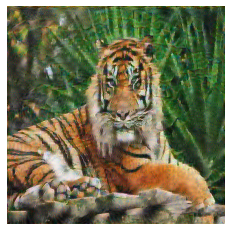

Epoch 4500 


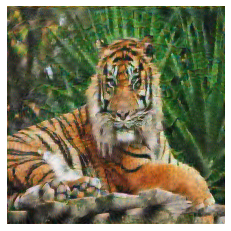

Epoch 4750 


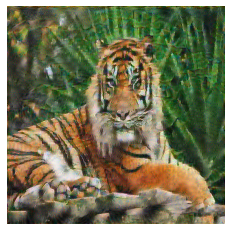

Epoch 5000 


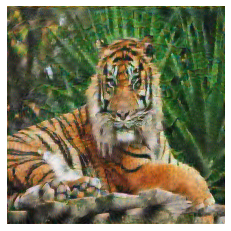

Epoch 5250 


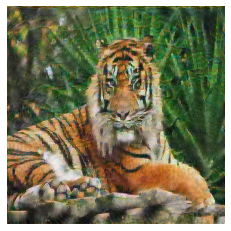

Epoch 5500 


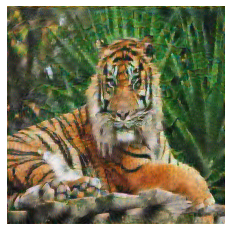

Epoch 5750 


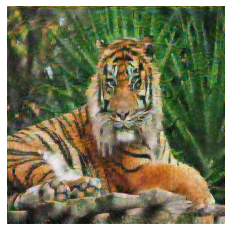

Epoch 6000 


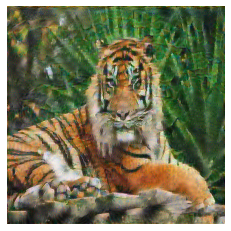

Epoch 6250 


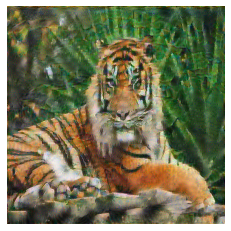

Epoch 6500 


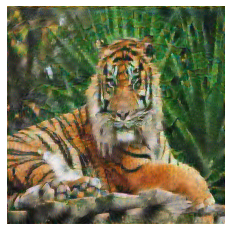

Epoch 6750 


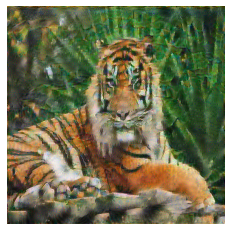

Epoch 7000 


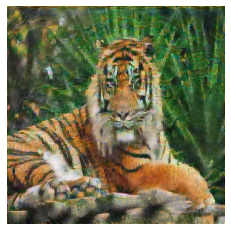

Epoch 7250 


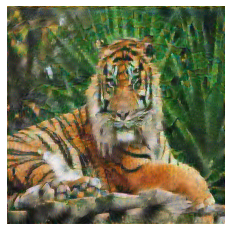

Epoch 7500 


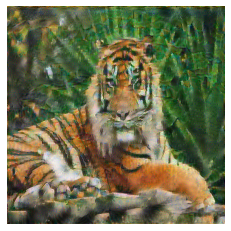

Epoch 7750 


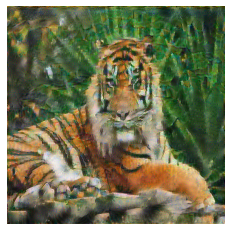

Epoch 8000 


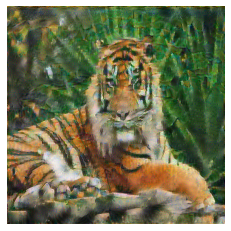

Epoch 8250 


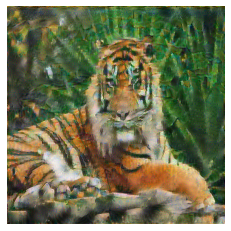

Epoch 8500 


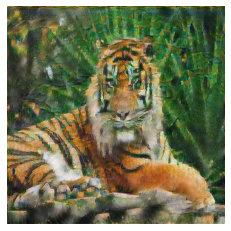

Epoch 8750 


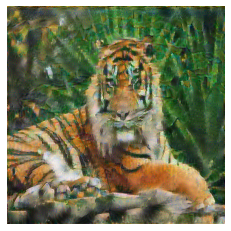

Epoch 9000 


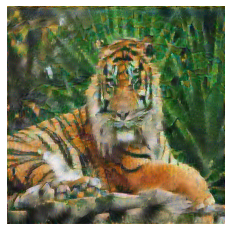

Epoch 9250 


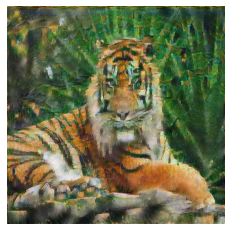

Epoch 9500 


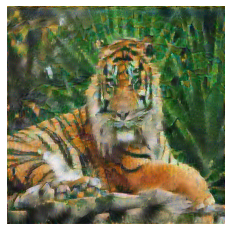

Epoch 9750 


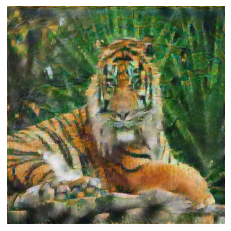

Epoch 10000 


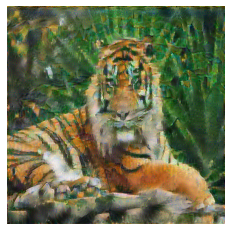

Epoch 10250 


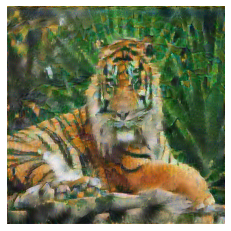

Epoch 10500 


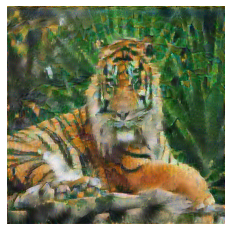

Epoch 10750 


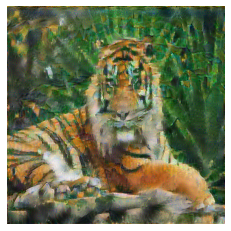

Epoch 11000 


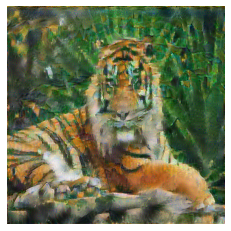

Epoch 11250 


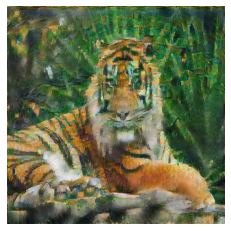

Epoch 11500 


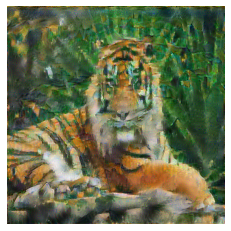

Epoch 11750 


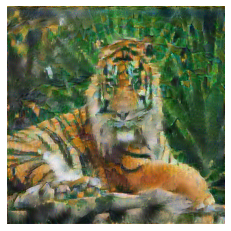

Epoch 12000 


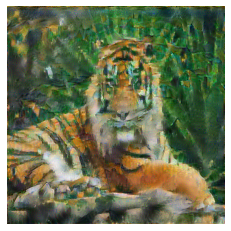

Epoch 12250 


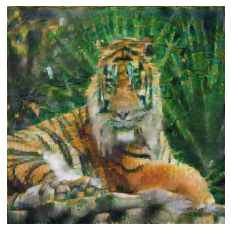

Epoch 12500 


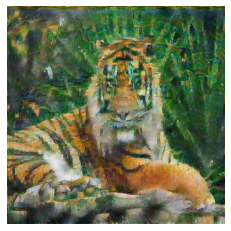

Epoch 12750 


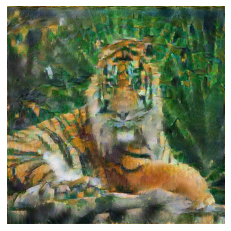

Epoch 13000 


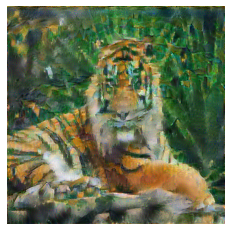

Epoch 13250 


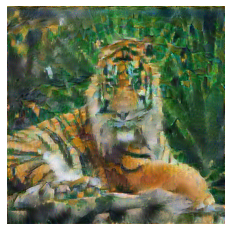

Epoch 13500 


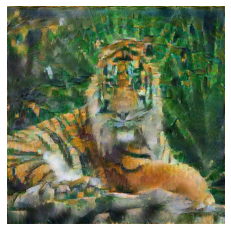

Epoch 13750 


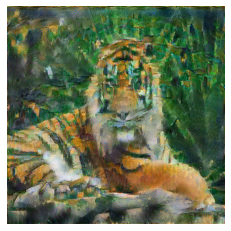

Epoch 14000 


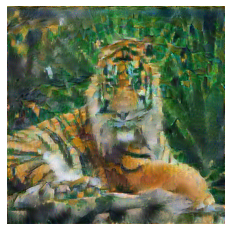

Epoch 14250 


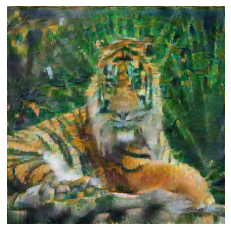

Epoch 14500 


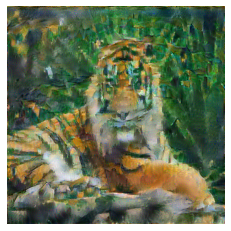

Epoch 14750 


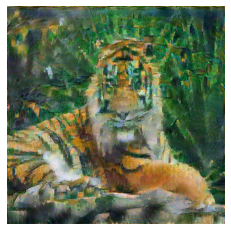

Epoch 15000 


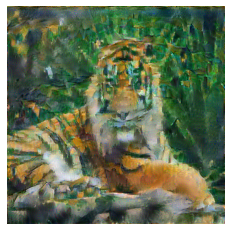

Epoch 15250 


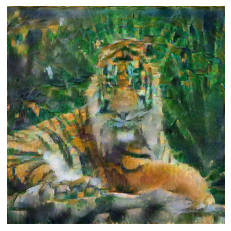

Epoch 15500 


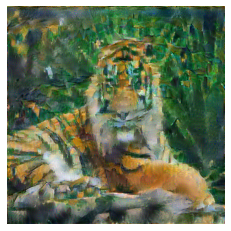

Epoch 15750 


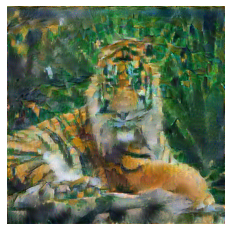

Epoch 16000 


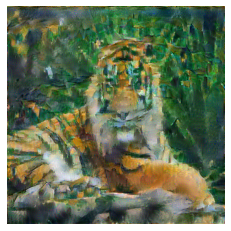

Epoch 16250 


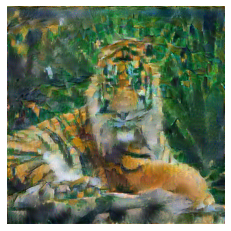

Epoch 16500 


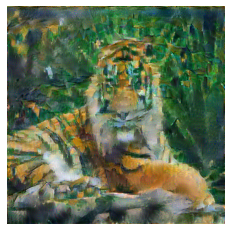

Epoch 16750 


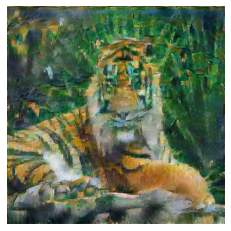

Epoch 17000 


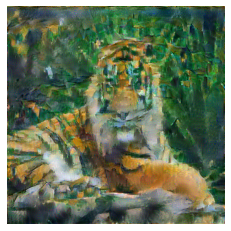

Epoch 17250 


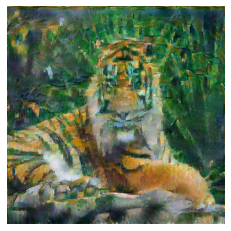

Epoch 17500 


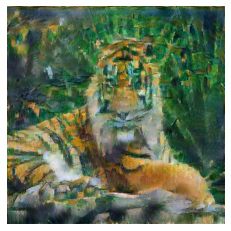

Epoch 17750 


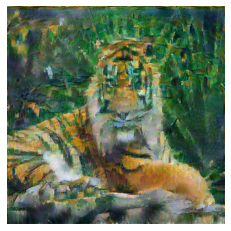

Epoch 18000 


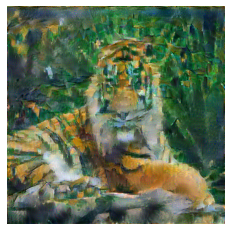

Epoch 18250 


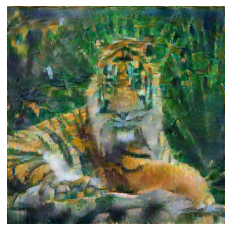

Epoch 18500 


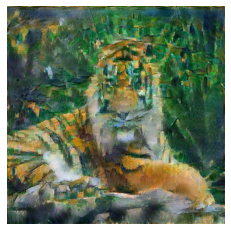

Epoch 18750 


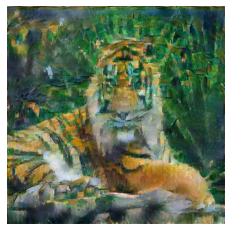

Epoch 19000 


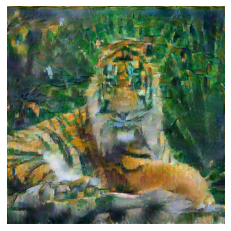

Epoch 19250 


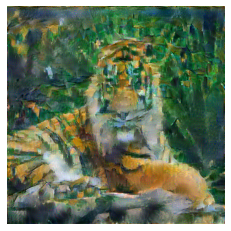

Epoch 19500 


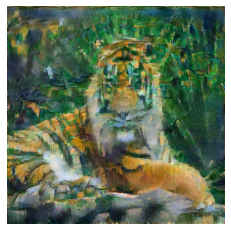

Epoch 19750 


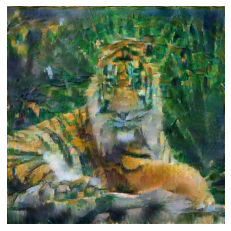

Epoch 20000 


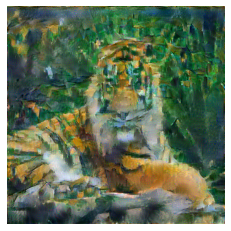

In [22]:
epochs = 20001
G_image = tf.Variable(G_image)
for i in range(epochs):
  train_step(G_image,style_layers)
  if i % 250 == 0:
    print(f"Epoch {i} ")
  if i % 250 == 0:
    image = tensor_to_image(G_image)
    plt.imshow(image)
    plt.axis("off")
    plt.show() 

image.save(f"/content/NST_data/image_{i}.jpg")
image.save(f"/content/drive/MyDrive/DeepLearn/datasets/image_{i}.jpg")